<a href="https://colab.research.google.com/github/eumoas/Alelo/blob/main/LH_CD_MIRIAMAGUIARSOBRAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## DESAFIO CIENTISTA DE DADOS - PROGRAMA LIGHT HOUSE INDICIUM
POR MIRIAM O. A SOBRAL


>> Você foi alocado em um time da Indicium contratado por um estúdio de Hollywood chamado PProductions, e agora deve fazer uma análise em cima de um banco de dados cinematográfico para orientar qual tipo de filme deve ser o próximo a ser desenvolvido. Lembre-se que há muito dinheiro envolvido, então a análise deve ser muito detalhada e levar em consideração o máximo de fatores possíveis (a introdução de dados externos é permitida - e encorajada).


## Dicionário dos dados


>> * Id	Colunas: Descrição
>> * 01	Series_Title:	Nome do filme
>> * 02	Released_Year: Ano de lançamento
>> * 03	Certificate: Classificação etária
>> * 04	Runtime: Tempo de duração
>> * 05	Genre: Gênero
>> * 06	IMDB_Rating: Nota do IMDB
>> * 07	Overview: 	Overview do filme
>> * 08	Meta_score: 	Média ponderada de todas as críticas
>> * 09	Director: 	Diretor
>> * 10	Star1:	Ator/atriz #1
>> * 11	Star2:	Ator/atriz #2
>> * 12	Star3:	Ator/atriz #3
>> * 13	Star4:	Ator/atriz #4
>> * 14	No_of_Votes:	Número de votos
>> * 15	Gross: Faturamento

##Steps
>> * 1 - Business Understanding
>> * 2 - Data Understanding  
>> * 3 - Data Preparation
>> * 4 - Modeling
>> * 5 - Evaluation  
>> * 6 - Deployment

## Entregas do projeto

>> * Produto A: Análise exploratória de dados (EDA)

>> * Produto B: Achados e insights

>> * Produto C: Modelagem Preditiva

>> * Produto D: Teste do modelo

>> * Produto E: Arquivo salvo.pkl

>> * Produto F: Repositório GITHUB



##1. Business Understanding

* A indústria cinematográfica enfrenta uma grande crise. De acordo com os dados divulgados durante a CinemaCon 2024, a consultoria Gower Street Analytics prevê que o mercado cinematográfico mundial movimentará US$ 32,3 bilhões (R$ 165,7 bilhões) em 2024, uma queda de US$ 1 bilhão (R$ 5,15 bilhões) ou 3% em relação a 2023. Essa diminuição, embora pareça pequena, é um golpe significativo para uma indústria que ainda tenta retornar aos níveis de bilheteria pré-pandêmicos. Em 2019, o mercado cinematográfico global movimentou US$ 42,5 bilhões (R$ 218 bilhões), de acordo com dados da Comscore. Portanto, a projeção de 2024 representa uma queda de aproximadamente 24% em relação ao período anterior à pandemia (UOL, 2024).

* Para enfrentar esse cenário desafiador, muitas produtoras têm utilizado a ciência de dados para projetar propostas de filmes que alcancem sucesso de bilheteria nos próximos meses. O uso de big data pode ser determinante para o sucesso na escolha do gênero, classificação etária e elenco de estrelas, visando atrair o público-alvo e maximizar o retorno financeiro.

* Através da análise de dados históricos de bilheteria, preferências do público, tendências de mercado e outros insights valiosos, as produtoras podem tomar decisões mais embasadas e estratégicas na seleção de projetos cinematográficos. Essa abordagem baseada em dados pode ajudar a indústria a se adaptar mais rapidamente às mudanças no comportamento do consumidor e a oferecer conteúdo que realmente atenda às expectativas do público.

Referências:

 Portal Uol: https://www.uol.com.br/splash/colunas/na-sua-tela/2024/05/19/cinema-queda-bilheteria-publico-2024.htm?cmpid=copiaecola

##2. Data Understanding

In [195]:
# Importando as bibliotecas
import pandas as pd
import numpy as np
import re
import nltk
!pip install nltk
nltk.download('punkt')
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor
import pickle
import plotly.express as px
from sklearn.linear_model import LinearRegression
from keras.models import Sequential
from keras.layers import Dense
import pickle
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import os
!pip install ydata-profiling
!pip install pandas-profiling
!pip install catboost
from ydata_profiling import ProfileReport
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [196]:
#Conectando ao google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [197]:
# Com o objetivo de compreender melhor a indústria cinematográfica, optou-se por adicionar às análises desse estudo um dataset também cedido pelo IMDb com 50 mil avaliações de filmes.
#Mais detalhes sobre esse dataset, acesse: http://ai.stanford.edu/~amaas/data/sentiment/
drive.mount('/content/drive', force_remount=True)
df = pd.read_csv("/content/drive/MyDrive/Indicium/desafio_indicium_imdb.csv")

Mounted at /content/drive


In [198]:
df.head(3)

,Unnamed: 0,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,1,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
1,2,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
2,3,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"


##3. Data Preparation

 Os dados brutos raramente estão prontos para a análise. Nesta fase, realizamos a limpeza dos dados, tratamos valores ausentes ou inconsistentes e integramos diferentes fontes de dados. O objetivo é criar um conjunto de dados preparado para as etapas subsequentes.

In [199]:
#Vamos iniciar a preparação dos dados, iniciando pelo dataset que foi cedido pela indicium
# Observando as primeiras infos do nosso dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     999 non-null    int64  
 1   Series_Title   999 non-null    object 
 2   Released_Year  999 non-null    object 
 3   Certificate    898 non-null    object 
 4   Runtime        999 non-null    object 
 5   Genre          999 non-null    object 
 6   IMDB_Rating    999 non-null    float64
 7   Overview       999 non-null    object 
 8   Meta_score     842 non-null    float64
 9   Director       999 non-null    object 
 10  Star1          999 non-null    object 
 11  Star2          999 non-null    object 
 12  Star3          999 non-null    object 
 13  Star4          999 non-null    object 
 14  No_of_Votes    999 non-null    int64  
 15  Gross          830 non-null    object 
dtypes: float64(2), int64(2), object(12)
memory usage: 125.0+ KB


In [200]:
#Conhecendo o tamanho do nosso dataset
df.shape

(999, 16)

In [201]:
# Analisando os tipos de variáveis
df.dtypes

Unnamed: 0         int64
Series_Title      object
Released_Year     object
Certificate       object
Runtime           object
Genre             object
IMDB_Rating      float64
Overview          object
Meta_score       float64
Director          object
Star1             object
Star2             object
Star3             object
Star4             object
No_of_Votes        int64
Gross             object
dtype: object

In [202]:
#Visualizando a existência de dados nulos
df.isnull().sum()

Unnamed: 0         0
Series_Title       0
Released_Year      0
Certificate      101
Runtime            0
Genre              0
IMDB_Rating        0
Overview           0
Meta_score       157
Director           0
Star1              0
Star2              0
Star3              0
Star4              0
No_of_Votes        0
Gross            169
dtype: int64

In [203]:
# Notamos que a coluna Unnamed não agrega ao estudo, portanto, vamos eliminá-la
df.drop(columns="Unnamed: 0", inplace=True)

In [204]:
# Contagem de linhas duplicadas
df.duplicated().sum()

0

In [205]:
# Contagem de NaNs por coluna
df.isna().sum()

Series_Title       0
Released_Year      0
Certificate      101
Runtime            0
Genre              0
IMDB_Rating        0
Overview           0
Meta_score       157
Director           0
Star1              0
Star2              0
Star3              0
Star4              0
No_of_Votes        0
Gross            169
dtype: int64

In [206]:
#Usamos a função para encontrar o número de valores únicos no eixo da coluna.
df.nunique()

Series_Title     998
Released_Year    100
Certificate       16
Runtime          140
Genre            202
IMDB_Rating       16
Overview         999
Meta_score        63
Director         548
Star1            659
Star2            840
Star3            890
Star4            938
No_of_Votes      998
Gross            822
dtype: int64

In [207]:
#Verificando os valores únicos de cada coluna
def valores_unicos(df, colunas):
    for coluna in colunas:
        print(f'\n Valores únicos coluna {coluna}:')
        print(df[coluna].unique())

In [208]:
#Verificando os valores únicos de cada coluna
val_unicos=['Released_Year', 'Runtime', 'Gross', 'Certificate']
valores_unicos(df,val_unicos)


 Valores únicos coluna Released_Year:
['1972' '2008' '1974' '1957' '2003' '1994' '1993' '2010' '1999' '2001'
 '1966' '2002' '1990' '1980' '1975' '2020' '2019' '2014' '1998' '1997'
 '1995' '1991' '1977' '1962' '1954' '1946' '2011' '2006' '2000' '1988'
 '1985' '1968' '1960' '1942' '1936' '1931' '2018' '2017' '2016' '2012'
 '2009' '2007' '1984' '1981' '1979' '1971' '1963' '1964' '1950' '1940'
 '2013' '2005' '2004' '1992' '1987' '1986' '1983' '1976' '1973' '1965'
 '1959' '1958' '1952' '1948' '1944' '1941' '1927' '1921' '2015' '1996'
 '1989' '1978' '1961' '1955' '1953' '1925' '1924' '1982' '1967' '1951'
 '1949' '1939' '1937' '1934' '1928' '1926' '1920' '1970' '1969' '1956'
 '1947' '1945' '1930' '1938' '1935' '1933' '1932' '1922' '1943' 'PG']

 Valores únicos coluna Runtime:
['175 min' '152 min' '202 min' '96 min' '201 min' '154 min' '195 min'
 '148 min' '139 min' '178 min' '142 min' '161 min' '179 min' '136 min'
 '146 min' '124 min' '133 min' '160 min' '132 min' '153 min' '169 min'
 '130 m

In [209]:
#Verificando os valores únicos de cada coluna
release_pg = df[df['Released_Year']=='PG']
release_pg

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
965,Apollo 13,PG,U,140 min,"Adventure, Drama, History",7.6,NASA must devise a strategy to return Apollo 1...,77.0,Ron Howard,Tom Hanks,Bill Paxton,Kevin Bacon,Gary Sinise,269197,"173,837,933"


In [210]:
#Como o filme foi rodado em 1995, optamos por substituir essa informação
df['Released_Year'] = df['Released_Year'].replace('PG', '1995')

In [211]:
# Verificando quantidade de linhas com zero
(df['Released_Year'] == 0).sum()

0

In [212]:
#Extraindo valores categóricos da coluna runtime, excluindo as vírgulas da variável gross
df['Runtime'] = df['Runtime'].str.extract('(\d+)')
df['Gross'] = df['Gross'].str.replace(',', '')
df[['Gross', 'Runtime', 'Series_Title']].head()

,Gross,Runtime,Series_Title
0,134966411,175,The Godfather
1,534858444,152,The Dark Knight
2,57300000,202,The Godfather: Part II
3,4360000,96,12 Angry Men
4,377845905,201,The Lord of the Rings: The Return of the King


In [213]:
#Tratamento das variáveis que estão em formato object Gross
df['Gross'] = df['Gross'].astype(float)

In [214]:
#Converte a coluna 'Released_Year' em um formato de data e hora, mantendo apenas o ano.
df['Released_Year'] = pd.to_datetime(df['Released_Year'], format='%Y')
df['Released_Year'] = df['Released_Year'].dt.year

In [215]:
#Insere a média dos valores não ausentes na coluna 'Meta_score', Gross e moda na  Certicate
df['Meta_score'].fillna(df['Meta_score'].mean(),inplace=True)
df['Gross'].fillna(df['Gross'].mean(),inplace=True)
df['Certificate'].fillna(df['Certificate'].mode()[0],inplace=True)

In [216]:
#Tratando outliers
variaveis = ['Gross']

In [217]:
#Vamos usar IQR (Interquartile Range) para removê-los.
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] > lower_bound) & (df[column] < upper_bound)]

In [218]:
# Aplicar a função remove_outliers_iqr a cada variável na lista
for column in variaveis:
    df = remove_outliers_iqr(df, column)

In [219]:
# Após finalizado a etapa de limpeza e tratamento dos dados, vamos realizar a EDA - EXPLORATORY DATA ANALYSIS
df.describe()

,Released_Year,IMDB_Rating,Meta_score,No_of_Votes,Gross
count,883.000000,883.000000,883.000000,8.830000e+02,8.830000e+02
mean,1989.430351,7.938279,78.055665,2.111446e+05,3.900290e+07
std,23.747406,0.260224,11.474185,2.517367e+05,3.804462e+07
min,1920.000000,7.600000,28.000000,2.508800e+04,1.305000e+03
25%,1973.000000,7.700000,72.000000,5.133750e+04,3.990500e+06
50%,1997.000000,7.900000,77.969121,1.083990e+05,2.826257e+07
75%,2008.000000,8.100000,86.000000,2.653800e+05,6.808257e+07
max,2020.000000,9.200000,100.000000,1.854740e+06,1.611978e+08


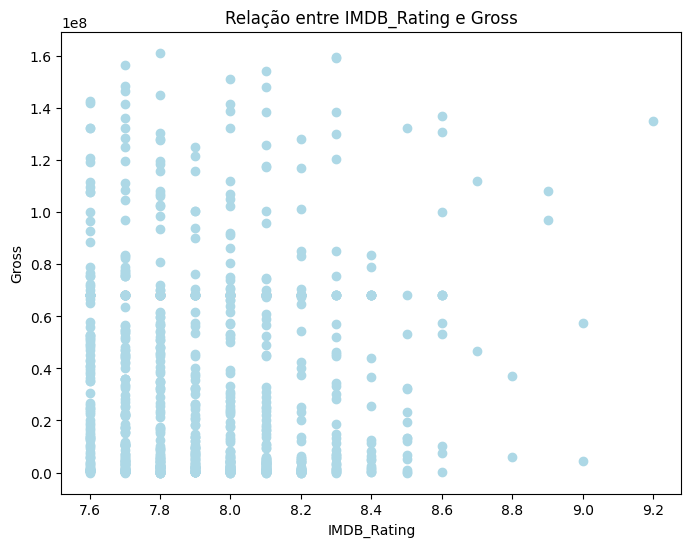

In [220]:
# Este gráfico mostra a relação entre a classificação do IMDB e a receita bruta dos filmes
plt.figure(figsize=(8, 6))
plt.scatter(df['IMDB_Rating'], df['Gross'], color='#ADD8E6')
plt.title('Relação entre IMDB_Rating e Gross')
plt.xlabel('IMDB_Rating')
plt.ylabel('Gross')
plt.show()

<Figure size 1000x600 with 0 Axes>

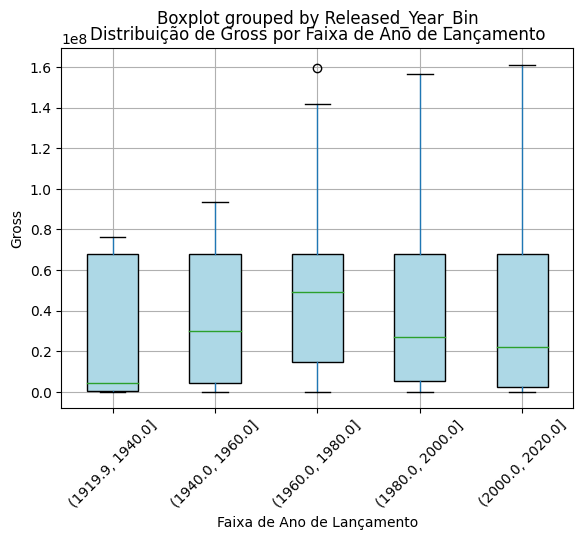

In [221]:
#mostra a distribuição da receita bruta (Gross) agrupada por faixas de ano de lançamento.
df['Released_Year_Bin'] = pd.cut(df['Released_Year'], bins=5)
plt.figure(figsize=(10, 6))
df.boxplot(column='Gross', by='Released_Year_Bin', patch_artist=True, boxprops=dict(facecolor='#ADD8E6'))
plt.title('Distribuição de Gross por Faixa de Ano de Lançamento')
plt.xlabel('Faixa de Ano de Lançamento')
plt.ylabel('Gross')
plt.xticks(rotation=45)
plt.show()

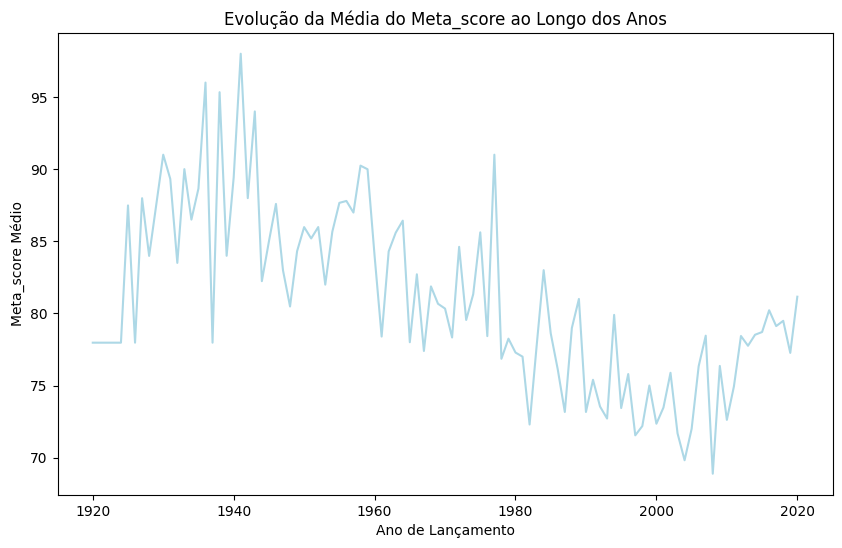

In [222]:
#Este gráfico de linha mostra a evolução da média da pontuação do Meta Score ao longo dos anos de lançamento.
plt.figure(figsize=(10, 6))
df.groupby('Released_Year')['Meta_score'].mean().plot(kind='line', color='#ADD8E6')
plt.title('Evolução da Média do Meta_score ao Longo dos Anos')
plt.xlabel('Ano de Lançamento')
plt.ylabel('Meta_score Médio')
plt.show()

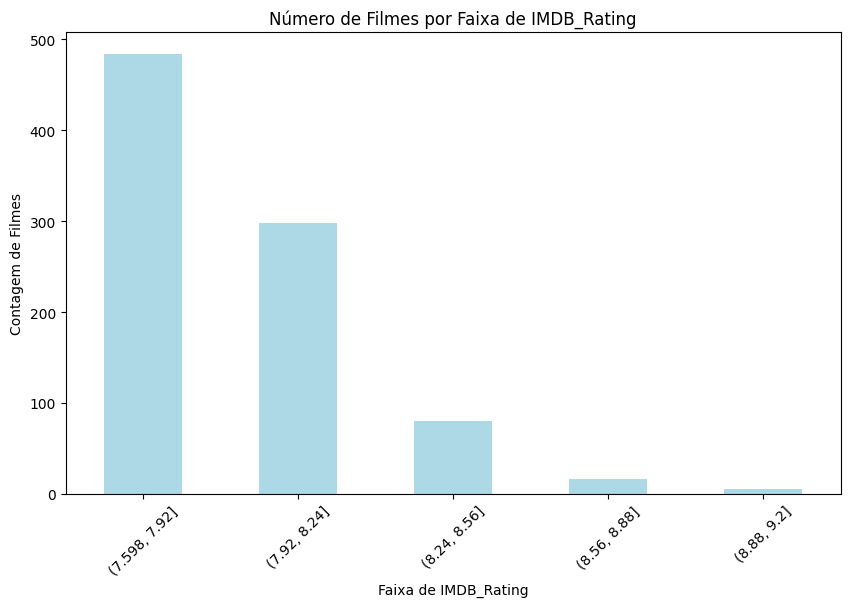

In [223]:
#Este gráfico de barras mostra a distribuição do número de filmes por faixa de classificação do IMDB.
plt.figure(figsize=(10, 6))
df['IMDB_Rating_Bin'] = pd.cut(df['IMDB_Rating'], bins=5)
df['IMDB_Rating_Bin'].value_counts().plot(kind='bar', color='#ADD8E6')
plt.title('Número de Filmes por Faixa de IMDB_Rating')
plt.xlabel('Faixa de IMDB_Rating')
plt.ylabel('Contagem de Filmes')
plt.xticks(rotation=45)
plt.show()

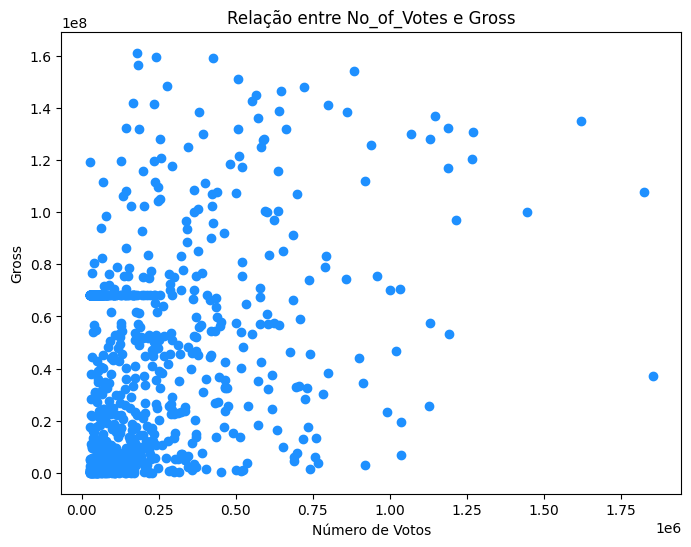

In [224]:
#Relação entre No_of_Votes e Gross
plt.figure(figsize=(8, 6))
plt.scatter(df['No_of_Votes'], df['Gross'], color='#1E90FF')
plt.title('Relação entre No_of_Votes e Gross')
plt.xlabel('Número de Votos')
plt.ylabel('Gross')
plt.show()

<Figure size 1200x600 with 0 Axes>

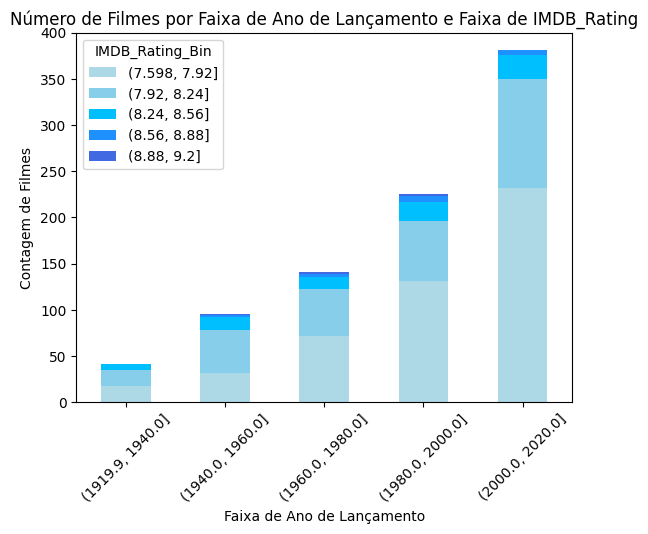

In [225]:
#Número de Filmes por Faixa de Ano de Lançamento e Faixa de IMDB_Rating
plt.figure(figsize=(12, 6))
df['Released_Year_Bin'] = pd.cut(df['Released_Year'], bins=5)
df['IMDB_Rating_Bin'] = pd.cut(df['IMDB_Rating'], bins=5)
df.groupby(['Released_Year_Bin', 'IMDB_Rating_Bin']).size().unstack(fill_value=0).plot(kind='bar', stacked=True, color=['#ADD8E6', '#87CEEB', '#00BFFF', '#1E90FF', '#4169E1'])
plt.title('Número de Filmes por Faixa de Ano de Lançamento e Faixa de IMDB_Rating')
plt.xlabel('Faixa de Ano de Lançamento')
plt.ylabel('Contagem de Filmes')
plt.xticks(rotation=45)
plt.show()

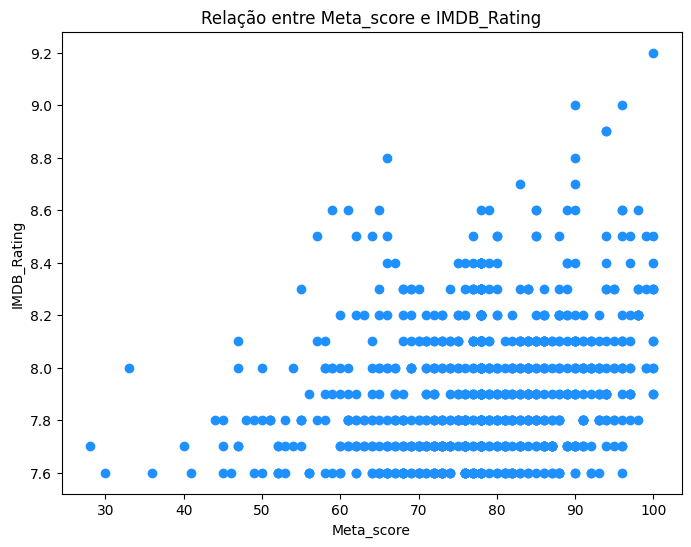

In [226]:
#Relação entre Meta_score e IMDB_Rating
plt.figure(figsize=(8, 6))
plt.scatter(df['Meta_score'], df['IMDB_Rating'], color='#1E90FF')
plt.title('Relação entre Meta_score e IMDB_Rating')
plt.xlabel('Meta_score')
plt.ylabel('IMDB_Rating')
plt.show()

<Figure size 1200x600 with 0 Axes>

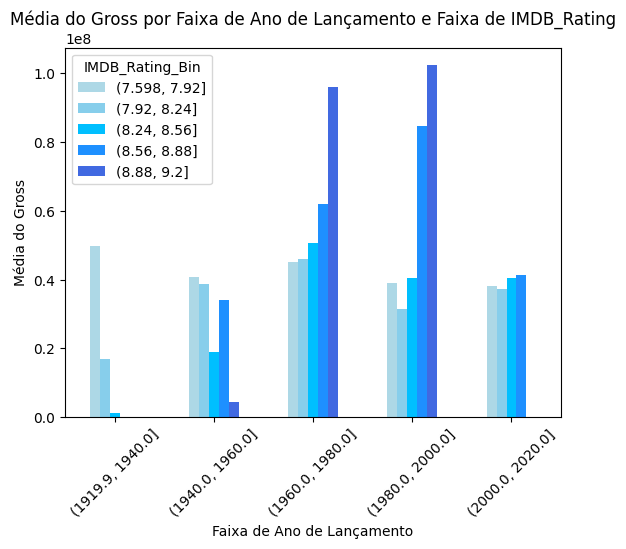

In [227]:
#Média do Gross por Faixa de Ano de Lançamento e Faixa de IMDB_Rating
plt.figure(figsize=(12, 6))
df['Released_Year_Bin'] = pd.cut(df['Released_Year'], bins=5)
df['IMDB_Rating_Bin'] = pd.cut(df['IMDB_Rating'], bins=5)
df.groupby(['Released_Year_Bin', 'IMDB_Rating_Bin'])['Gross'].mean().unstack().plot(kind='bar', color=['#ADD8E6', '#87CEEB', '#00BFFF', '#1E90FF', '#4169E1'])
plt.title('Média do Gross por Faixa de Ano de Lançamento e Faixa de IMDB_Rating')
plt.xlabel('Faixa de Ano de Lançamento')
plt.ylabel('Média do Gross')
plt.xticks(rotation=45)
plt.show()

<Figure size 1200x600 with 0 Axes>

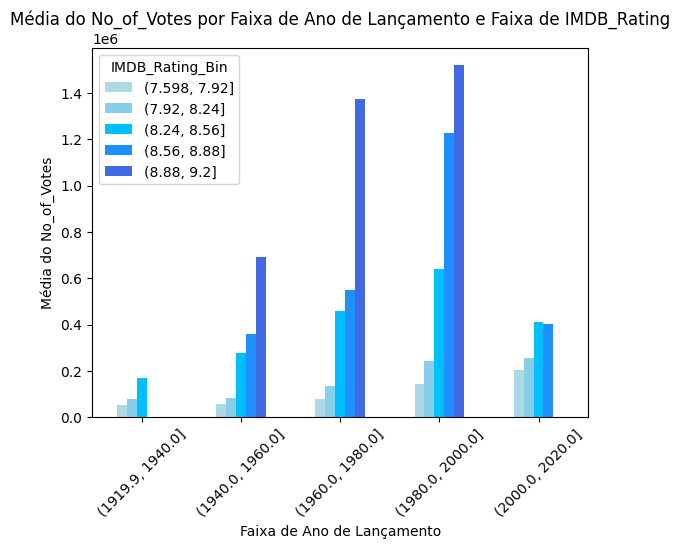

In [228]:
#Média do No_of_Votes por Faixa de Ano de Lançamento e Faixa de IMDB_Rating
plt.figure(figsize=(12, 6))
df['Released_Year_Bin'] = pd.cut(df['Released_Year'], bins=5)
df['IMDB_Rating_Bin'] = pd.cut(df['IMDB_Rating'], bins=5)
df.groupby(['Released_Year_Bin', 'IMDB_Rating_Bin'])['No_of_Votes'].mean().unstack().plot(kind='bar', color=['#ADD8E6', '#87CEEB', '#00BFFF', '#1E90FF', '#4169E1'])
plt.title('Média do No_of_Votes por Faixa de Ano de Lançamento e Faixa de IMDB_Rating')
plt.xlabel('Faixa de Ano de Lançamento')
plt.ylabel('Média do No_of_Votes')
plt.xticks(rotation=45)
plt.show()

In [229]:
# Este gráfico de dispersão interativo permite visualizar a relação entre a classificação do IMDB e a pontuação do Meta Score.
fig = px.scatter(df,
                 x='IMDB_Rating',
                 y='Meta_score',
                 size='No_of_Votes',
                 color='Gross',
                 title='Relação entre IMDB_Rating e Meta_score',
                 labels={'IMDB_Rating': 'IMDB Rating', 'Meta_score': 'Meta Score'},
                 color_continuous_scale='Blues',
                 hover_name=df.index)

# Exibir o gráfico
fig.show()

In [230]:
#Este gráfico de área interativo mostra a evolução da média da receita bruta ao longo dos anos de lançamento.
# Calcular a média do Gross por ano
mean_gross = df.groupby('Released_Year')['Gross'].mean().reset_index()

# Criar o gráfico de área interativo
fig = px.area(mean_gross,
               x='Released_Year',
               y='Gross',
               title='Evolução da Média do Gross ao Longo dos Anos',
               labels={'Gross': 'Média do Gross', 'Released_Year': 'Ano de Lançamento'},
               color_discrete_sequence=['#1E90FF'])

# Exibir o gráfico
fig.show()

In [141]:
#Chamando a função para criação do nosso relatório
profile = ProfileReport(df, title = "Profiling Report")

In [142]:
#Visualizando o profile
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

** INFORMAÇÕES SOBRE O DATASET


* Desafios:

1. O dataset possuiam 999 linhas e 16 colunas
2. Os dados se dividiam em float, int e object
3. Encontramos valores ausentes nas colunas Certificate, MetaScore e Gross.
4. Foi identificado presença dado com informação divergente na coluna 5. Released_Year
6. Haviam colunas com dados categóricos e quantitativos
7. Também identificamos vírgulas nos numerais
8. Encontramos outliers na coluna gross



* Ações tomadas:

1. Notamos que a coluna Unnamed não agrega ao estudo, portanto, vamos eliminá-la
2. Na coluna Released_Year, tratamos com a inclusão da informação correta - referente ao ano de lançamento
3. Inserimos a média dos valores ausentes na coluna gross e meta score.
4. Na certificate inserimos a moda, ou seja o valor mais comum à variável.
5. Converte a coluna 'Released_Year' em um formato de data e hora, mantendo apenas o ano.
6. Extraímos valores categóricos da coluna runtime, excluindo as vírgulas da variável gross
7. Transformamos a variável gross de object para float
8. Tratamos outlier na coluna gross



>>> **Produto A: EDA**

In [143]:
#Baixando o EDA para html
profile.to_file('EDA.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

>>> **Produto B: Achados e insights**


* Qual filme você recomendaria para uma pessoa que você não conhece?
Eu recomendaria o filme com a nota mais elevada no IMDb e que por coincidência é o meu filme favorito da vida: The Godfather

Quais são os principais fatores que estão relacionados com alta expectativa de faturamento de um filme?

Conforme observado no EDA - a maior correlação de faturamento de um filme é ("Relação entre notas IMDB e Metascore e faturamento"), o Metascore pode influenciar a receita bruta, mesmo sem haver correlação linear entre Metascore e Gross, como visto na análise de correlação.

Filmes de aventura se destacam no gráfico de faturamento

 Quais insights podem ser tirados com a coluna Overview? É possível inferir o gênero do filme a partir dessa coluna?

As palavras "thrilling", "adventure", "action-packed" pode indicar que filmes de aventura e ação podem ser um bom investimento, pois abrange um público amplo, crianças, adultos e idosos.

Palavras como "hero", "young", "romantic", "story" indicam que histórias envolventes e personagens carismáticos são importantes para o sucesso de um filme. Considerar histórias envolventes e personagens carismáticos.

Explorar diferentes gêneros, incluindo ficção científica:
A presença da palavra "science fiction" sugere que investir em filmes de ficção científica pode ser uma boa estratégia. Filmes desse gênero podem atrair um público específico e gerar interesse, especialmente se combinados com outros elementos populares, como aventura e ação.

Ambientar histórias em diferentes épocas: A menção de "1800s" indica que ambientar filmes em diferentes épocas pode ser uma abordagem interessante.
Filmes históricos ou com ambientação em períodos menos comuns podem se destacar e atrair a atenção do público.

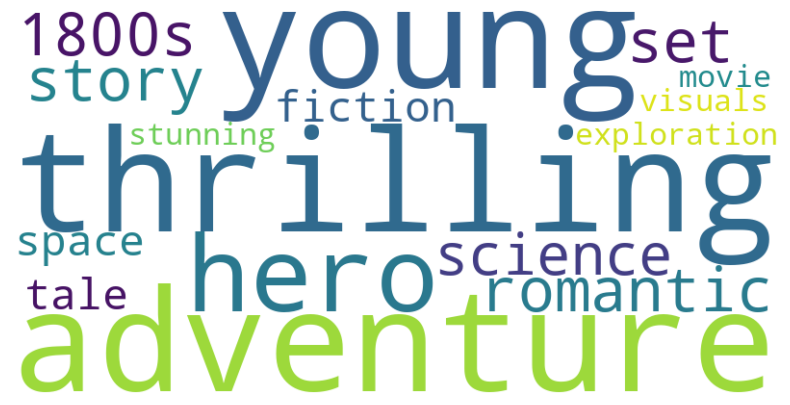

Palavras mais relevantes:
thrilling    1
adventure    1
young        1
hero         1
romantic     1
story        1
set          1
1800s        1
science      1
fiction      1
Name: count, dtype: int64


In [180]:
#Definindo um novo dataset  para extrair o melhor da variável overview
data = {
    'overview': [
        "A thrilling adventure of a young hero.",
        "A romantic story set in the 1800s.",
        "A science fiction tale about space exploration.",
        "An action-packed movie with stunning visuals."
    ]
}
df = pd.DataFrame(data)

In [181]:
# Tokenização e remoção de stopwords
stop_words = set(stopwords.words('english'))
all_words = []

for overview in df['overview']:
    # Tokenizar
    words = word_tokenize(overview.lower())  # Converte para minúsculas
    # Filtrar stopwords
    filtered_words = [word for word in words if word.isalnum() and word not in stop_words]
    all_words.extend(filtered_words)

In [182]:
# Criar uma nuvem de palavras
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(all_words))

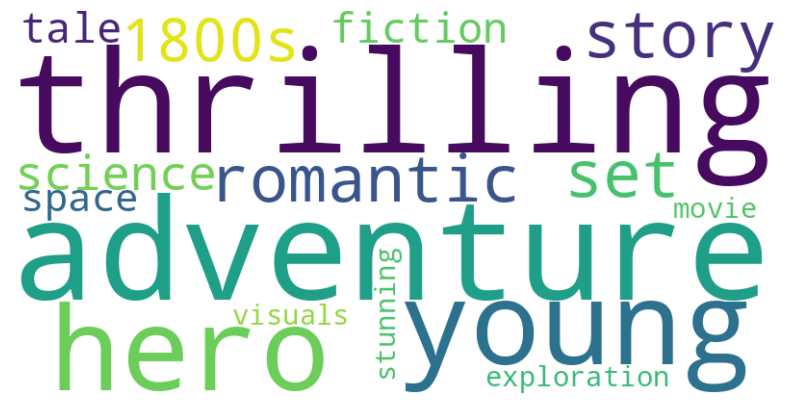

In [183]:
# Exibir a nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Não mostrar os eixos
plt.show()

In [184]:
# Calcular a frequência das palavras
word_freq = pd.Series(all_words).value_counts()

In [185]:
# Extrair as palavras mais relevantes
top_words = word_freq.head(10)  # As 10 palavras mais comuns
print("Palavras mais relevantes:")
print(top_words)

Palavras mais relevantes:
thrilling    1
adventure    1
young        1
hero         1
romantic     1
story        1
set          1
1800s        1
science      1
fiction      1
Name: count, dtype: int64


## 4. Modelagem (Modeling)

A fase de modelagem envolve a aplicação de técnicas e algoritmos de modelagem de dados aos dados preparados. Selecionamos as técnicas mais adequadas, como regressão, classificação ou agrupamento, e ajustamos e avaliamos os modelos para garantir sua precisão e eficácia.


>>> **Produto C: Modelagem Preditiva**


#Variáveis e transformação

* Inicialmente, a base de dados foi dividida em dois subconjuntos distintos: o conjunto de treinamento e o conjunto de teste. O conjunto de treinamento foi utilizado para ajustar e calibrar os modelos preditivos, enquanto o conjunto de teste serviu para avaliar o desempenho desses modelos treinados. Essa abordagem de divisão dos dados foi crucial para garantir que os resultados obtidos fossem generalizáveis e para evitar o problema de overfitting, no qual o modelo se ajusta excessivamente aos dados de treinamento, perdendo sua capacidade de generalização. Removemos as colunas 'Series_Title', 'Released_Year', 'Runtime', 'Overview', 'Star1', 'Star2', 'Star3', 'Star4' porque entendemos que não agregavam ao modelo.

* Avaliação da Performance dos Modelos
A performance dos modelos de regressão foi avaliada com base em métricas recomendadas pela literatura científica relevante, incluindo:
Coeficiente de Determinação (R²): Indicava a proporção da variabilidade na variável dependente que era explicada pelas variáveis independentes no modelo.
Erro Quadrático Médio (MSE): Mediu a média dos quadrados dos erros de previsão, penalizando erros maiores de forma mais acentuada.
Raiz do Erro Quadrático Médio (RMSE): Forneceu a raiz quadrada da média dos quadrados dos erros de previsão, apresentando os erros na mesma escala da variável dependente.
Erro Absoluto Médio (MAE): Forneceu a média dos valores absolutos dos erros de previsão, oferecendo uma medida mais intuitiva dos erros.
Essas métricas permitiram analisar a capacidade preditiva dos modelos e selecionar aquele que apresentava o melhor desempenho geral.

* Variáveis Utilizadas
As variáveis selecionadas para a modelagem incluíam:
released_year: Ano de lançamento do filme
certificate: Classificação indicativa, após transformação em variáveis dummy
runtime: Duração do filme
genre: Gênero do filme, após transformação em variáveis dummy
meta_score: Pontuação do filme no Metacritic
no_of_votes: Número de votos recebidos
gross: Receita bruta do filme

* Essas variáveis foram escolhidas com base em uma análise exploratória prévia dos dados, realizada durante a etapa de pré-processamento, transformação e análise exploratória da base de dados. Nessa etapa, foram aplicadas as transformações necessárias para preparar os dados para a modelagem, como a conversão da variável runtime para um formato numérico adequado, o tratamento de valores ausentes e a normalização de variáveis, quando apropriado.
Ao empregar esses modelos de regressão e as variáveis selecionadas, esperava-se obter previsões precisas da nota do IMDb, contribuindo para uma compreensão mais profunda dos fatores que influenciam a avaliação dos filmes pelos usuários.

## Tipo de Problema

* Estamos lidando com um problema de regressão, pois o objetivo é prever uma variável contínua: a nota do IMDb dos filmes. A regressão é apropriada aqui, uma vez que estamos tentando estimar valores numéricos com base em diferentes características dos filmes.

## O Modelo

* O modelo que apresentou o melhor desempenho na métrica de RMSE foi o Random Forest, pois possui menores valores de MSE e RMSE, além de um R² mais alto, indicando que ele é mais eficaz em capturar a variância nos dados.
Regressão Linear teve um desempenho razoável, mas não conseguiu explicar bem a variância dos dados, como indicado pelo R² baixo.
Rede Neural apresentou resultados variáveis dependendo da configuração, mas a configuração com 40 neurônios foi a mais promissora. No entanto, o desempenho geral ainda não superou o Random Forest.

* Vantagens do Random Forest
Robustez e Estabilidade: O Random Forest é um modelo de aprendizado de máquina que combina múltiplas árvores de decisão, o que o torna menos suscetível a variações nos dados de entrada. Isso resulta em previsões mais estáveis e confiáveis.
Capacidade de Lidar com Dados Não Lineares: O modelo é eficaz em capturar relações não lineares entre as variáveis, o que é uma vantagem em muitos conjuntos de dados complexos.
Importância das Variáveis: O Random Forest fornece uma medida de importância das variáveis, permitindo identificar quais fatores têm maior impacto nas previsões. Isso pode ser útil para interpretação e análise de dados.
Menos Necessidade de Pré-processamento: O modelo pode lidar com dados faltantes e não requer normalização ou padronização das variáveis, o que simplifica o processo de preparação dos dados.

* Desvantagens do Random Forest
Complexidade e Tempo de Treinamento: Embora o Random Forest seja robusto, ele pode ser mais lento para treinar em comparação com modelos mais simples, especialmente em conjuntos de dados muito grandes.
Menos Interpretável: Apesar de fornecer informações sobre a importância das variáveis, o Random Forest é considerado menos interpretável do que modelos simples, como a regressão linear. A complexidade do modelo pode dificultar a compreensão de como as previsões são feitas.
Tendência ao Overfitting em Conjuntos Pequenos: Em conjuntos de dados pequenos, o Random Forest pode se ajustar excessivamente aos dados de treinamento, levando a um desempenho inferior em dados não vistos.
Conclusão
O Random Forest é uma escolha poderosa para problemas de regressão, especialmente quando se busca robustez e capacidade de lidar com dados complexos. No entanto, suas desvantagens, como a complexidade e o tempo de treinamento, devem ser consideradas ao escolher o modelo mais apropriado para uma tarefa específica.

In [146]:
#Fizemos uma cópia do DataFrame df e a armazenamos em uma nova variável e também verificamos se hvia ficado algum valor nulo
dfr = df.copy()
print(dfr.isnull().sum())

Series_Title     0
Released_Year    0
Certificate      0
Runtime          0
Genre            0
IMDB_Rating      0
Overview         0
Meta_score       0
Director         0
Star1            0
Star2            0
Star3            0
Star4            0
No_of_Votes      0
Gross            0
dtype: int64


In [147]:
#As variáveis não deve apresentar relevância para o modelo por isso serão removidas
dfr = dfr.drop(columns=['Series_Title', 'Released_Year', 'Runtime', 'Overview', 'Star1', 'Star2', 'Star3', 'Star4'])

In [148]:
# Confirmando as nossas variáveis no dataset
dfr.info( )

<class 'pandas.core.frame.DataFrame'>
Index: 883 entries, 0 to 998
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Certificate  883 non-null    object 
 1   Genre        883 non-null    object 
 2   IMDB_Rating  883 non-null    float64
 3   Meta_score   883 non-null    float64
 4   Director     883 non-null    object 
 5   No_of_Votes  883 non-null    int64  
 6   Gross        883 non-null    float64
dtypes: float64(3), int64(1), object(3)
memory usage: 87.5+ KB


In [149]:
#Converte as colunas categóricas 'Certificate', 'Genre' e 'Director' em valores numéricos usando LabelEncoder.
# Adicionando 1 a cada valor numérico para que os valores comecem em 1 para facilitar a interpretação do algoritmo
# Criando dicionários de mapeamento para cada coluna, para saber qual número corresponde a cada categoria original.
label_encoder = LabelEncoder()
dfr['Certificate'] = label_encoder.fit_transform(dfr['Certificate']) + 1
certificate_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_) + 1))
dfr['Genre'] = label_encoder.fit_transform(dfr['Genre']) + 1
genre_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_) + 1))
dfr['Director'] = label_encoder.fit_transform(dfr['Director']) + 1
director_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_) + 1))

In [150]:
#Observando o nosso mapeamento
print("Mapeamento para 'Certificate':")
print(certificate_mapping)
print("\nMapeamento para 'Genre':")
print(genre_mapping)
print("\nMapeamento para 'Director':")
print(director_mapping)

Mapeamento para 'Certificate':
{'16': 1, 'A': 2, 'Approved': 3, 'G': 4, 'GP': 5, 'PG': 6, 'PG-13': 7, 'Passed': 8, 'R': 9, 'TV-14': 10, 'TV-MA': 11, 'TV-PG': 12, 'U': 13, 'U/A': 14, 'UA': 15, 'Unrated': 16}

Mapeamento para 'Genre':
{'Action, Adventure': 1, 'Action, Adventure, Biography': 2, 'Action, Adventure, Comedy': 3, 'Action, Adventure, Crime': 4, 'Action, Adventure, Drama': 5, 'Action, Adventure, Fantasy': 6, 'Action, Adventure, History': 7, 'Action, Adventure, Horror': 8, 'Action, Adventure, Romance': 9, 'Action, Adventure, Sci-Fi': 10, 'Action, Adventure, Thriller': 11, 'Action, Adventure, War': 12, 'Action, Adventure, Western': 13, 'Action, Biography, Crime': 14, 'Action, Biography, Drama': 15, 'Action, Comedy, Crime': 16, 'Action, Comedy, Fantasy': 17, 'Action, Comedy, Mystery': 18, 'Action, Comedy, Romance': 19, 'Action, Crime, Comedy': 20, 'Action, Crime, Drama': 21, 'Action, Crime, Mystery': 22, 'Action, Crime, Thriller': 23, 'Action, Drama': 24, 'Action, Drama, History':

In [151]:
#Checando nossas colunas
dfr.columns

Index(['Certificate', 'Genre', 'IMDB_Rating', 'Meta_score', 'Director',
       'No_of_Votes', 'Gross'],
      dtype='object')

In [152]:
#Selecionando a nossa variável alvo -  que vamos prever.
X = dfr.drop('IMDB_Rating', axis=1)
# variável dependente
y = dfr['IMDB_Rating']

In [153]:
# Definindo tamanhos para os conjuntos de teste que podem ser utilizados posteriormente ao dividir os dados em conjuntos de treinamento e teste.
test_sizes = [0.2, 0.3]

In [154]:
#Dividir um conjunto de dados em conjuntos de treinamento e teste, treinar um modelo de regressão linear com os dados de treinamento
def train_test_regression(X, y, test_size=0.2, random_state=7):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    return mse, r2, mape, rmse

In [155]:
#Conhecendo os valores
print('Regressão Linear')
print()
for test_size in test_sizes:
    mse, r2, mape, rmse = train_test_regression(X, y, test_size=test_size)
    print(f'Test Size: {test_size}')
    print('MAPE (Mean Absolute Percentage Error):', mape)
    print('MSE (Mean Squared Error):', mse)
    print('R2:', r2)
    print('RMSE:', rmse)
    print('---------------------------------------------------------------')

Regressão Linear

Test Size: 0.2
MAPE (Mean Absolute Percentage Error): 2.2870287639534412
MSE (Mean Squared Error): 0.04673564743482177
R2: 0.21880343465995955
RMSE: 0.21618429044410642
---------------------------------------------------------------
Test Size: 0.3
MAPE (Mean Absolute Percentage Error): 2.2753319663185905
MSE (Mean Squared Error): 0.047190430525477695
R2: 0.19414542969412296
RMSE: 0.21723358516923136
---------------------------------------------------------------


In [156]:
#Treinando modelo de regressão usando o algoritmo de Random Forest
def train_test_random_forest(X, y, test_size=0.3, random_state=7, n_estimators=100):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    model = RandomForestRegressor(n_estimators=n_estimators)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    rmse = np.sqrt(mse)
    return mse, r2, mape, rmse

In [157]:
#Conhecendo os valores
print('Random Forest')
print()
for test_size in test_sizes:
    mse, r2, mape, rmse = train_test_random_forest(X, y, test_size=test_size)
    print(f'Test Size: {test_size}')
    print('MAPE (Mean Absolute Percentage Error):', mape)
    print('MSE (Mean Squared Error):', mse)
    print('R2:', r2)
    print('RMSE:', np.sqrt(mse))
    print('---------------------------------------------------------------')

Random Forest

Test Size: 0.2
MAPE (Mean Absolute Percentage Error): 2.113445586549235
MSE (Mean Squared Error): 0.04111832768361593
R2: 0.3126981624943961
RMSE: 0.20277654618721547
---------------------------------------------------------------
Test Size: 0.3
MAPE (Mean Absolute Percentage Error): 2.0074830758493416
MSE (Mean Squared Error): 0.03854460754716992
R2: 0.34178714187056336
RMSE: 0.19632780635246228
---------------------------------------------------------------


In [158]:
#Selecionando a nossa variável alvo -  que vamos prever.
X = dfr.drop('IMDB_Rating', axis=1)
y = dfr['IMDB_Rating']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

In [159]:
# Treinando a nossa rede neural
def train_test_neural_network_1_layer(X, y, hidden_layers=1, neurons=10, activation='relu', test_size=0.2, epochs=20, batch_size=32):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=7)
    model = Sequential()
    model.add(Dense(neurons, input_dim=X_train.shape[1], activation=activation))
    for _ in range(hidden_layers - 1):
        model.add(Dense(neurons, activation=activation))
    model.add(Dense(1, activation='linear'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_test, y_test), verbose=0)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    return mse, rmse

In [160]:
# Configurações para testar
configurations = [
    (1, 10, 'relu'),  # 1 camada escondida com 10 neurônios e função de ativação ReLU
    (1, 20, 'relu'),  # 1 camada escondida com 20 neurônios e função de ativação ReLU
    (1, 30, 'relu'),  # 1 camada escondida com 30 neurônios e função de ativação ReLU
    (1, 40, 'relu'),  # 1 camada escondida com 40 neurônios e função de ativação ReLU
    (1, 50, 'relu'),  # 1 camada escondida com 50 neurônios e função de ativação ReLU
]

# Parâmetros de teste
test_size = 0.2
epochs = 20
batch_size = 32

print('Rede neural (configuração: nº camadas, nº neurônios, função de ativação)')
for config in configurations:
    hidden_layers, neurons, activation = config
    mse, rmse = train_test_neural_network_1_layer(X, y, hidden_layers=hidden_layers, neurons=neurons, activation=activation, test_size=test_size, epochs=epochs, batch_size=batch_size)
    print(f'Configuração: {config}')
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('------------------------------------------------------------------------------------------')

Rede neural (configuração: nº camadas, nº neurônios, função de ativação)
6/6 [==============================] - 0s 2ms/step
Configuração: (1, 10, 'relu')
MSE: 7042604.682703959
RMSE: 2653.7906252573807
------------------------------------------------------------------------------------------
6/6 [==============================] - 0s 3ms/step
Configuração: (1, 20, 'relu')
MSE: 33737103.26307275
RMSE: 5808.364938868145
------------------------------------------------------------------------------------------
6/6 [==============================] - 0s 2ms/step
Configuração: (1, 30, 'relu')
MSE: 901747.7170503623
RMSE: 949.6039790619889
------------------------------------------------------------------------------------------
6/6 [==============================] - 0s 2ms/step
Configuração: (1, 40, 'relu')
MSE: 1687000.1168943038
RMSE: 1298.8456863285583
------------------------------------------------------------------------------------------
6/6 [==============================] - 0s 3ms/st

## 5. Avaliação (Evaluation)

A avaliação dos modelos desenvolvidos é crucial para medir sua qualidade e desempenho. Nesta fase, utilizamos métodos como validação cruzada e métricas de desempenho para avaliar o quão bem os modelos se saem em dados não vistos. Com base nessa avaliação, podemos ajustar e aprimorar os modelos, se necessário.

In [161]:
# Definindo o modelo
model = RandomForestRegressor(random_state=7)

# Definindo os hiperparâmetros a serem testados
param_grid = {
    'n_estimators': [50, 100, 200],  # Número de árvores na floresta
    'max_depth': [None, 10, 20, 30],  # Profundidade máxima da árvore
    'min_samples_split': [2, 5, 10],  # Número mínimo de amostras necessárias para dividir um nó
    'min_samples_leaf': [1, 2, 4]  # Número mínimo de amostras necessárias em um nó folha
}

# Configurando o Grid Search com validação cruzada
grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                           scoring='neg_mean_squared_error',
                           cv=5,  # Número de folds para validação cruzada
                           verbose=2,
                           n_jobs=-1)  # Usar todos os núcleos disponíveis

# Executando o Grid Search
grid_search.fit(X_train, y_train)

# Resultados do Grid Search
print("Melhores hiperparâmetros encontrados:")
print(grid_search.best_params_)

# Previsões com o melhor modelo encontrado
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Avaliação do modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"MSE: {mse:.4f}")
print(f"R²: {r2:.4f}")

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Melhores hiperparâmetros encontrados:
{'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
MSE: 0.0395
R²: 0.3401


>>> **Produto D: Teste do modelo **


Amostra
* {'Series_Title': 'The Shawshank Redemption',
* 'Released_Year': '1994',
* 'Certificate': 'A',
* 'Runtime': '142 min',
* 'Genre': 'Drama',
* 'Overview': 'Two imprisoned men bond over a number of years, finding solace and eventual redemption through acts of common decency.',
* 'Meta_score': 80.0,
* 'Director': 'Frank Darabont',
* 'Star1': 'Tim Robbins',
* 'Star2': 'Morgan Freeman',
* 'Star3': 'Bob Gunton',
* 'Star4': 'William Sadler',
* 'No_of_Votes': 2343110,
* 'Gross': '28,341,469'}
 >>>Qual seria a nota do IMDB? 8.626

Será necessário realizar a conversão dos valores de texto para os números correspondentes às categorias numéricas dos atributos bairro, bairro_grupo e room_type.

In [ ]:
#Será necessário realizar a conversão dos valores de texto para os números correspondentes às categorias numéricas dos atributos certificate, director

In [168]:
print("Número associado a 'Certificate':", certificate_mapping['A'])

Número associado a 'Certificate': 2


In [169]:
print("Número associado a 'Director':", director_mapping['Frank Darabont'])

Número associado a 'Director': 128


In [170]:
amostra = {
 'Released_Year':1994,
 'Certificate': 2,
 'Runtime': 142,
 'Genre': 7,
 'Meta_score': 80.0,
 'Director': 128,
 'No_of_Votes': 2343110,
 'Gross': 28341469
  }

In [172]:
#Aplicando o random forest melhor resultado na amostra sugerida
def train_test_random_forest(X, y, test_size=0.2, random_state=7, n_estimators=100):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    modelRF = RandomForestRegressor(n_estimators=n_estimators)
    modelRF.fit(X_train, y_train)
    joblib.dump(modelRF, 'final_model.pkl')
    return modelRF
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=7)
model = train_test_random_forest(X_train, y_train)

In [173]:
new_df = pd.DataFrame(amostra, columns=X.columns, index=[0])
predicted_rating = model.predict(new_df)
print("IMDB_Rating:", predicted_rating)

IMDB_Rating: [8.626]


## 6. Implantação (Deployment)

A fase final da metodologia CRISP-DM é a implantação do modelo em um ambiente de produção. Integramos o modelo aos sistemas existentes, monitoramos seu desempenho contínuo e garantimos a adoção pela equipe de negócios.

Produto E: Arquivo salvo.pkl

In [175]:
#Salvando o nosso modelo
with open('LH_CD_MiriamAguiarSobral_modelo.pkl', 'wb') as arquivo:
    pickle.dump(df, arquivo)

**Produto F:** GitHUB https://github.com/eumoas/LH_CD_MiriamAguiarSobral_IMDb/tree/main

Qual tipo de filme deve ser o próximo a ser desenvolvido?

Com base nas análises realizadas ao longo deste desafio e com o objetivo de maximizar o faturamento, proponho a criação de um filme de aventura e ação. A presença de um diretor renomado será um fator crucial para o sucesso do projeto, pois sua reputação pode atrair um público maior e aumentar a credibilidade do filme.
Outro aspecto fundamental para o êxito do filme são as estratégias de marketing implementadas durante o desenvolvimento e o lançamento. Uma campanha de marketing bem elaborada pode criar um burburinho em torno do filme, aumentando a visibilidade e atraindo um público diversificado.